In [3]:
!pip install paddleocr
!pip install ultralytics opencv-python-headless
!pip install paddlepaddle

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 88.4/88.4 kB 2.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 407.5/407.5 kB 7.4 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 294.9/294.9 kB 17.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 244.3/244.3 kB 14.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.4/3.4 MB 61.8 MB/s eta 0:00:00:00:01
  Created wheel for fire: filename=fire-0.6.0-py2.py3-none-any.whl size=117031 sha256=3963cdf188434ea958ece6e6f7bf52e5dc004636f934384ca8b56b69390609be
  Stored in directory: /root/.cache/pip/wheels/d6/6d/5d/5b73fa0f46d01a793713f8859201361e9e581ced8c75e5c6a3
Successfully built fire
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.3/41.3 kB 1.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 862.6/862.6 kB 14.0 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 125.9/125.9 MB 13.1 MB/s eta 0:00:0000:0100:01


# Class Distribution

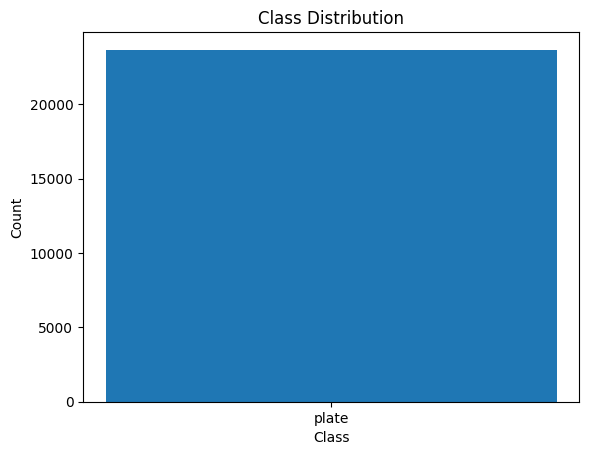

In [70]:
from collections import Counter

# Define the classes
classes = ['plate']
dataset_path = '/kaggle/input/car-plate-dataset/Car-Plate-Detection-6'
label_dirs = ['train/labels', 'valid/labels', 'test/labels']

class_counts = Counter()
for label_dir in label_dirs:
    label_path = os.path.join(dataset_path, label_dir)
    for label_file in os.listdir(label_path):
        with open(os.path.join(label_path, label_file), 'r') as f:
            for line in f.readlines():
                class_id = int(line.strip().split()[0])
                class_counts[classes[class_id]] += 1

# Plot the class distribution
plt.bar(class_counts.keys(), class_counts.values())
plt.xlabel('Class')
plt.ylabel('Count')
plt.title('Class Distribution')
plt.show()

# Basic Data Overview
**Description**:
* This includes loading the dataset and looking at its structure, such as the number of samples, number of features, and basic statistics.
* For an image dataset, you can display some sample images along with their labels.

Total images: 4764


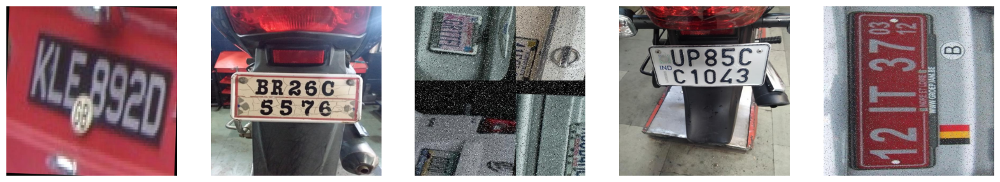

In [71]:
dataset_path_train = '/kaggle/input/car-plate-dataset/Car-Plate-Detection-6/train/images'

# List files in the directory
image_files = os.listdir(dataset_path_train)
print(f'Total images: {len(image_files)}')

# Display a few sample images
fig, axes = plt.subplots(1, 5, figsize=(20, 5))
for i, img_file in enumerate(image_files[:5]):
    img_path = os.path.join(dataset_path_train, img_file)
    img = cv2.imread(img_path)
    axes[i].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    axes[i].axis('off')
plt.show()

# Image Dimension Analysis
Description:
* Check the dimensions of the images to ensure consistency.
* This can help identify if any images need resizing or preprocessing.

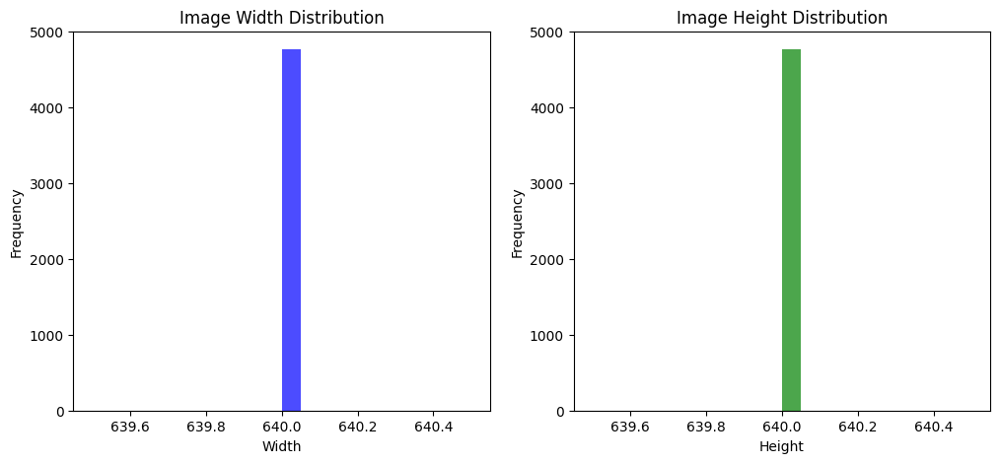

In [72]:
# Initialize lists to store dimensions
widths = []
heights = []

# Iterate over image files and record dimensions
for img_file in os.listdir(dataset_path_train):
    img_path = os.path.join(dataset_path_train, img_file)
    img = cv2.imread(img_path)
    h, w = img.shape[:2]
    widths.append(w)
    heights.append(h)

# Plot histograms of image dimensions
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.hist(widths, bins=20, color='blue', alpha=0.7)
plt.xlabel('Width')
plt.ylabel('Frequency')
plt.title('Image Width Distribution')

plt.subplot(1, 2, 2)
plt.hist(heights, bins=20, color='green', alpha=0.7)
plt.xlabel('Height')
plt.ylabel('Frequency')
plt.title('Image Height Distribution')

plt.show()

# Count of examples in training, validation and test folder 

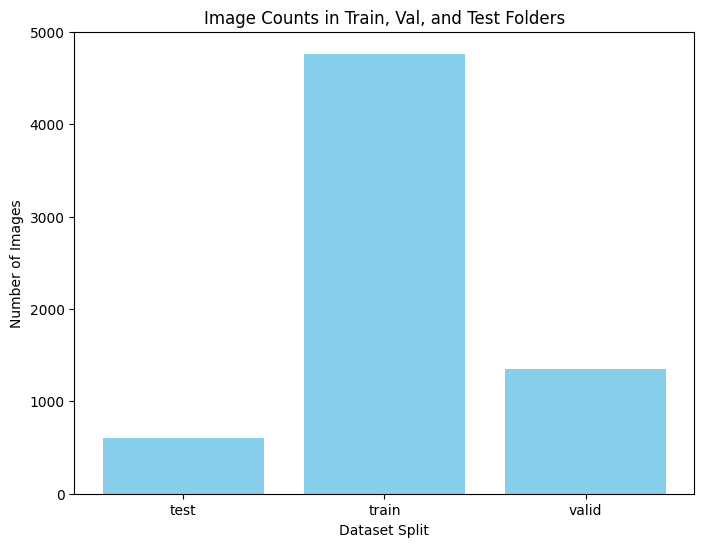

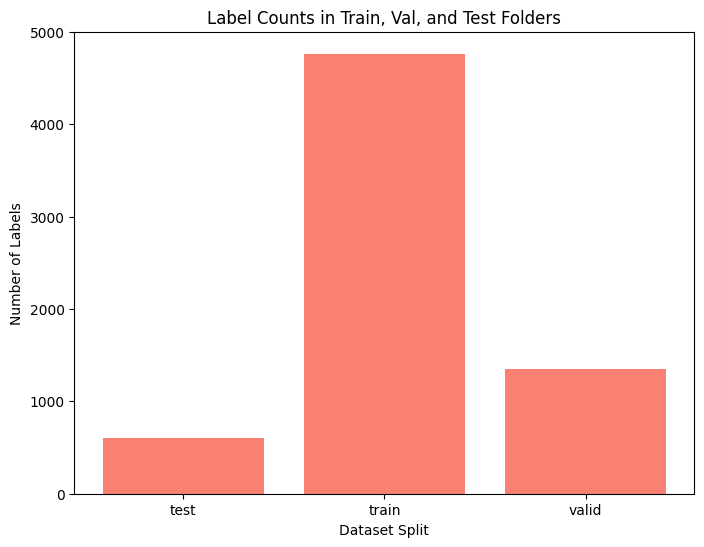

Image Counts:
test: 608 images
train: 4764 images
valid: 1350 images

Label Counts:
test: 608 labels
train: 4764 labels
valid: 1350 labels


In [81]:
# Define paths
base_dir = '/kaggle/input/car-plate-dataset/Car-Plate-Detection-6'
folders = ['test','train','valid']
extensions = ('.jpg', '.jpeg', '.png')  # Add other image file extensions if needed


# Initialize counters
image_counts = {}
label_counts = {}

for folder in folders:
    image_dir = os.path.join(base_dir, folder, 'images')
    label_dir = os.path.join(base_dir, folder, 'labels')
    
    # Count images
    image_counts[folder] = len([f for f in os.listdir(image_dir) if f.endswith(extensions)])
    
    # Count labels
    label_counts[folder] = len([f for f in os.listdir(label_dir) if f.endswith('.txt')])

# Plotting image counts
plt.figure(figsize=(8, 6))
plt.bar(image_counts.keys(), image_counts.values(), color='skyblue')
plt.xlabel('Dataset Split')
plt.ylabel('Number of Images')
plt.title('Image Counts in Train, Val, and Test Folders')
plt.show()

# Plotting label counts
plt.figure(figsize=(8, 6))
plt.bar(label_counts.keys(), label_counts.values(), color='salmon')
plt.xlabel('Dataset Split')
plt.ylabel('Number of Labels')
plt.title('Label Counts in Train, Val, and Test Folders')
plt.show()

# Print the results
print("Image Counts:")
for folder in folders:
    print(f"{folder}: {image_counts[folder]} images")

print("\nLabel Counts:")
for folder in folders:
    print(f"{folder}: {label_counts[folder]} labels")

In [4]:
import os
import torch
import torch.utils.checkpoint
from ultralytics import YOLO
import cv2
import matplotlib.pyplot as plt
from paddleocr import PaddleOCR, draw_ocr
import numpy as np
from PIL import Image


In [3]:
model = YOLO('yolov8s.pt')  # Download the pre-trained YOLOv8 model

# Define the paths
dataset_path = '/kaggle/input/car-plate-dataset/Car-Plate-Detection-6'
data_yaml_path = os.path.join(dataset_path, 'data.yaml')
working_directory = '/kaggle/working'

100%|██████████| 21.5M/21.5M [00:00<00:00, 233MB/s]


In [4]:
import shutil
# Copy data.yaml to a writable directory
shutil.copy(data_yaml_path, working_directory)
data_yaml_path_writable = os.path.join(working_directory, 'data.yaml')

# Ensure your data.yaml has the correct paths
data_yaml_content = f"""
train: {dataset_path}/train/images
val: {dataset_path}/valid/images
test: {dataset_path}/test/images

nc: 1  # number of classes
names: ['plat']
"""

In [5]:
# Write the correct paths to data.yaml in the writable directory
with open(data_yaml_path_writable, 'w') as f:
    f.write(data_yaml_content)


In [6]:
# Training configuration
train_cfg = {
    'imgsz': 640,  # Image size
    'batch': 16,   # Batch size
    'epochs': 30,  # Number of epochs
    'data': data_yaml_path_writable,
}

In [7]:
model.train(data=train_cfg['data'], imgsz=train_cfg['imgsz'], epochs=train_cfg['epochs'], batch=train_cfg['batch'])


Ultralytics YOLOv8.2.70 🚀 Python-3.10.13 torch-2.1.2 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: task=detect, mode=train, model=yolov8s.pt, data=/kaggle/working/data.yaml, epochs=30, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, 

100%|██████████| 755k/755k [00:00<00:00, 18.8MB/s]
2024-07-31 07:04:08,413	INFO util.py:124 -- Outdated packages:
  ipywidgets==7.7.1 found, needs ipywidgets>=8
Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.
2024-07-31 07:04:09,283	INFO util.py:124 -- Outdated packages:
  ipywidgets==7.7.1 found, needs ipywidgets>=8
Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.


Overriding model.yaml nc=80 with nc=1

                   from  n    params  module                                       arguments                     
  0                  -1  1       928  ultralytics.nn.modules.conv.Conv             [3, 32, 3, 2]                 
  1                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  2                  -1  1     29056  ultralytics.nn.modules.block.C2f             [64, 64, 1, True]             
  3                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  4                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  5                  -1  1    295424  ultralytics.nn.modules.conv.Conv             [128, 256, 3, 2]              
  6                  -1  2    788480  ultralytics.nn.modules.block.C2f             [256, 256, 2, True]           
  7                  -1  1   1180672  ultralytics

wandb: Logging into wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: You can find your API key in your browser here: https://wandb.ai/authorize
wandb: Paste an API key from your profile and hit enter, or press ctrl+c to quit:

  ········································


wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


Freezing layer 'model.22.dfl.conv.weight'
AMP: running Automatic Mixed Precision (AMP) checks with YOLOv8n...


100%|██████████| 6.25M/6.25M [00:00<00:00, 109MB/s]


AMP: checks passed ✅


train: Scanning /kaggle/input/car-plate-dataset/Car-Plate-Detection-6/train/labels... 4764 images, 0 backgrounds, 0 corrupt: 100%|██████████| 4764/4764 [00:13<00:00, 353.29it/s]


train: WARNING ⚠️ Cache directory /kaggle/input/car-plate-dataset/Car-Plate-Detection-6/train is not writeable, cache not saved.
WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 2375, len(boxes) = 16521. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


val: Scanning /kaggle/input/car-plate-dataset/Car-Plate-Detection-6/valid/labels... 1350 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1350/1350 [00:03<00:00, 366.94it/s]


val: WARNING ⚠️ Cache directory /kaggle/input/car-plate-dataset/Car-Plate-Detection-6/valid is not writeable, cache not saved.
WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 605, len(boxes) = 4950. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.
Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 4 dataloader workers
Logging results to runs/detect/train
Starting training for 30 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/30      4.68G     0.9516      0.913      1.149        115        640: 100%|██████████| 298/298 [01:34<00:00,  3.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 43/43 [00:12<00:00,  3.46it/s]


                   all       1350       4950      0.883      0.788      0.866      0.618

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/30      4.62G      0.987     0.7838      1.176         75        640: 100%|██████████| 298/298 [01:29<00:00,  3.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 43/43 [00:10<00:00,  3.91it/s]

                   all       1350       4950      0.922      0.873      0.924      0.692



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/30      4.62G     0.9723      0.749      1.169         72        640: 100%|██████████| 298/298 [01:28<00:00,  3.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 43/43 [00:10<00:00,  3.95it/s]

                   all       1350       4950       0.93      0.878      0.933      0.719



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/30      4.61G     0.9364     0.6887      1.149         59        640: 100%|██████████| 298/298 [01:28<00:00,  3.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 43/43 [00:11<00:00,  3.86it/s]

                   all       1350       4950       0.96       0.91      0.942      0.745



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/30      4.58G     0.9018     0.6368      1.128         57        640: 100%|██████████| 298/298 [01:28<00:00,  3.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 43/43 [00:10<00:00,  3.92it/s]

                   all       1350       4950      0.909      0.902      0.936       0.74



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/30      4.61G     0.8789     0.6075       1.12         81        640: 100%|██████████| 298/298 [01:28<00:00,  3.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 43/43 [00:11<00:00,  3.85it/s]

                   all       1350       4950      0.973       0.91      0.946      0.767



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/30      4.57G     0.8706     0.6005      1.116         92        640: 100%|██████████| 298/298 [01:28<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 43/43 [00:11<00:00,  3.86it/s]

                   all       1350       4950      0.959      0.913      0.947      0.763



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/30       4.6G     0.8451     0.5629      1.099         58        640: 100%|██████████| 298/298 [01:28<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 43/43 [00:10<00:00,  3.93it/s]

                   all       1350       4950      0.976      0.929      0.957      0.775



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/30      4.57G     0.8346     0.5466      1.098         62        640: 100%|██████████| 298/298 [01:27<00:00,  3.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 43/43 [00:10<00:00,  3.95it/s]

                   all       1350       4950      0.976       0.93       0.96      0.783



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/30      4.59G     0.8209     0.5289      1.088         71        640: 100%|██████████| 298/298 [01:28<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 43/43 [00:10<00:00,  3.97it/s]

                   all       1350       4950      0.974      0.932      0.961      0.783



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/30      4.57G     0.8081     0.5195      1.081         69        640: 100%|██████████| 298/298 [01:28<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 43/43 [00:10<00:00,  3.99it/s]

                   all       1350       4950      0.975      0.932      0.961      0.789



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/30      4.61G     0.8083     0.5131       1.08         84        640: 100%|██████████| 298/298 [01:27<00:00,  3.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 43/43 [00:11<00:00,  3.85it/s]

                   all       1350       4950      0.974      0.936      0.961      0.782



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/30      4.58G     0.7982     0.4992      1.075         76        640: 100%|██████████| 298/298 [01:28<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 43/43 [00:10<00:00,  3.95it/s]

                   all       1350       4950      0.978      0.937      0.961      0.793



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/30      4.61G      0.789     0.4918      1.074        102        640: 100%|██████████| 298/298 [01:28<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 43/43 [00:10<00:00,  3.94it/s]

                   all       1350       4950      0.979       0.93      0.965      0.801



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/30      4.57G     0.7807     0.4802      1.069         52        640: 100%|██████████| 298/298 [01:28<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 43/43 [00:10<00:00,  3.97it/s]

                   all       1350       4950      0.976      0.946      0.967      0.801



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/30      4.59G     0.7724     0.4712      1.064         63        640: 100%|██████████| 298/298 [01:27<00:00,  3.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 43/43 [00:10<00:00,  3.94it/s]

                   all       1350       4950      0.981      0.936      0.967      0.797



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/30      4.57G     0.7634     0.4578      1.054         64        640: 100%|██████████| 298/298 [01:27<00:00,  3.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 43/43 [00:10<00:00,  3.93it/s]

                   all       1350       4950      0.983      0.935      0.966      0.801



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/30      4.59G      0.762      0.457      1.061         52        640: 100%|██████████| 298/298 [01:28<00:00,  3.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 43/43 [00:11<00:00,  3.88it/s]

                   all       1350       4950      0.983      0.941      0.966      0.803



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/30      4.57G     0.7569     0.4506      1.057         54        640: 100%|██████████| 298/298 [01:28<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 43/43 [00:10<00:00,  3.96it/s]

                   all       1350       4950      0.981      0.944      0.969      0.809



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/30      4.61G     0.7432     0.4371      1.047         66        640: 100%|██████████| 298/298 [01:27<00:00,  3.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 43/43 [00:10<00:00,  3.96it/s]

                   all       1350       4950      0.983      0.941      0.969      0.812


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/30      4.57G     0.6907      0.399      1.035         39        640: 100%|██████████| 298/298 [01:28<00:00,  3.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 43/43 [00:10<00:00,  4.01it/s]

                   all       1350       4950      0.983      0.941       0.97      0.808



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/30      4.61G     0.6834     0.3917      1.033         34        640: 100%|██████████| 298/298 [01:27<00:00,  3.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 43/43 [00:10<00:00,  3.94it/s]

                   all       1350       4950      0.986      0.943      0.971      0.812



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/30      4.57G     0.6793     0.3815       1.03         40        640: 100%|██████████| 298/298 [01:27<00:00,  3.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 43/43 [00:11<00:00,  3.88it/s]

                   all       1350       4950      0.983      0.943      0.971      0.813



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/30      4.59G     0.6727     0.3729       1.02         48        640: 100%|██████████| 298/298 [01:27<00:00,  3.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 43/43 [00:10<00:00,  3.95it/s]

                   all       1350       4950      0.986      0.945      0.972      0.816



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/30      4.57G     0.6633       0.36      1.019         62        640: 100%|██████████| 298/298 [01:27<00:00,  3.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 43/43 [00:10<00:00,  4.00it/s]

                   all       1350       4950      0.987      0.945      0.973      0.818



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/30       4.6G     0.6586      0.358      1.021         13        640: 100%|██████████| 298/298 [01:27<00:00,  3.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 43/43 [00:10<00:00,  4.00it/s]

                   all       1350       4950      0.982      0.947      0.971      0.821



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/30      4.57G     0.6492     0.3477      1.006         41        640: 100%|██████████| 298/298 [01:27<00:00,  3.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 43/43 [00:10<00:00,  3.98it/s]

                   all       1350       4950      0.988      0.944      0.972      0.819



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/30      4.61G      0.641     0.3359      1.007         46        640: 100%|██████████| 298/298 [01:27<00:00,  3.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 43/43 [00:11<00:00,  3.90it/s]

                   all       1350       4950      0.987      0.946      0.973      0.823



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/30      4.57G     0.6351     0.3289      1.004         43        640: 100%|██████████| 298/298 [01:27<00:00,  3.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 43/43 [00:10<00:00,  3.96it/s]

                   all       1350       4950      0.987      0.947      0.973      0.826



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/30       4.6G     0.6271     0.3192     0.9976         43        640: 100%|██████████| 298/298 [01:27<00:00,  3.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 43/43 [00:10<00:00,  3.98it/s]

                   all       1350       4950      0.985      0.949      0.975      0.825



30 epochs completed in 0.839 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 22.5MB
Optimizer stripped from runs/detect/train/weights/best.pt, 22.5MB

Validating runs/detect/train/weights/best.pt...
Ultralytics YOLOv8.2.70 🚀 Python-3.10.13 torch-2.1.2 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
Model summary (fused): 168 layers, 11,125,971 parameters, 0 gradients, 28.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 43/43 [00:14<00:00,  3.06it/s]


                   all       1350       4950      0.987      0.947      0.973      0.826
Speed: 0.2ms preprocess, 4.7ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to runs/detect/train


lr/pg0,▃▆██▇▇▇▇▆▆▆▆▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▂▁▁
lr/pg1,▃▆██▇▇▇▇▆▆▆▆▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▂▁▁
lr/pg2,▃▆██▇▇▇▇▆▆▆▆▅▅▅▅▄▄▄▄▃▃▃▃▂▂▂▂▁▁
metrics/mAP50(B),▁▅▅▆▆▆▆▇▇▇▇▇▇▇████████████████
metrics/mAP50-95(B),▁▃▄▅▅▆▆▆▇▇▇▇▇▇▇▇▇▇▇█▇█████████
metrics/precision(B),▁▄▄▆▃▇▆▇▇▇▇▇▇▇▇███████████████
metrics/recall(B),▁▅▅▆▆▆▇▇▇▇▇▇█▇█▇▇█████████████
model/GFLOPs,▁
model/parameters,▁
model/speed_PyTorch(ms),▁
train/box_loss,▇██▇▆▆▆▅▅▅▅▅▄▄▄▄▄▄▄▃▂▂▂▂▂▂▁▁▁▁


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7a49b0460100>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.048048, 

In [32]:
model_path = 'yolov8_Car_Plate.pt'
model.save(model_path)
print(f'Trained model saved as {model_path}')


NameError: name 'model' is not defined

In [65]:
yolo_model = YOLO('/kaggle/working/yolov8_Car_Plate.pt')  

# Initialize PaddleOCR
ocr = PaddleOCR(use_angle_cls=True, lang='en')

[2024/07/31 12:04:05] ppocr DEBUG: Namespace(help='==SUPPRESS==', use_gpu=False, use_xpu=False, use_npu=False, use_mlu=False, ir_optim=True, use_tensorrt=False, min_subgraph_size=15, precision='fp32', gpu_mem=500, gpu_id=0, image_dir=None, page_num=0, det_algorithm='DB', det_model_dir='/root/.paddleocr/whl/det/en/en_PP-OCRv3_det_infer', det_limit_side_len=960, det_limit_type='max', det_box_type='quad', det_db_thresh=0.3, det_db_box_thresh=0.6, det_db_unclip_ratio=1.5, max_batch_size=10, use_dilation=False, det_db_score_mode='fast', det_east_score_thresh=0.8, det_east_cover_thresh=0.1, det_east_nms_thresh=0.2, det_sast_score_thresh=0.5, det_sast_nms_thresh=0.2, det_pse_thresh=0, det_pse_box_thresh=0.85, det_pse_min_area=16, det_pse_scale=1, scales=[8, 16, 32], alpha=1.0, beta=1.0, fourier_degree=5, rec_algorithm='SVTR_LCNet', rec_model_dir='/root/.paddleocr/whl/rec/en/en_PP-OCRv4_rec_infer', rec_image_inverse=True, rec_image_shape='3, 48, 320', rec_batch_num=6, max_text_length=25, rec_c

In [41]:
# def enhance_image(image):
#     # Convert to grayscale
#     gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
#     # Apply adaptive histogram equalization
#     clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
#     enhanced = clahe.apply(gray)
    
#     # Apply Gaussian blur to reduce noise
#     blurred = cv2.GaussianBlur(enhanced, (5, 5), 0)
    
#     # Apply thresholding
#     _, threshold = cv2.threshold(blurred, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    
#     return threshold

In [66]:
def detect_and_recognize_text(image_path, yolo_model, ocr):
    # Load the image
    image = cv2.imread(image_path)
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    
    # Detect license plates
    results = yolo_model(image_path)
    
    # Process the results
    for i, result in enumerate(results):
        boxes = result.boxes.xyxy.cpu().numpy()  # x1, y1, x2, y2
        
        for j, box in enumerate(boxes):
            x1, y1, x2, y2 = map(int, box)
            cropped_image = image[y1:y2, x1:x2]
            
            # Check if the cropped image is valid
            if cropped_image.size == 0:
                print(f"Skipping empty cropped region at: ({x1}, {y1}), ({x2}, {y2})")
                continue
            
            # Enhance the cropped image
#             enhanced_image = enhance_image(cropped_image)
            
            # Recognize text using PaddleOCR
            ocr_result = ocr.ocr(cropped_image, cls=True)
            
            # Display cropped image and OCR result
            plt.figure(figsize=(10, 5))
            plt.subplot(1, 2, 1)
            plt.imshow(cv2.cvtColor(cropped_image, cv2.COLOR_BGR2RGB))
            plt.title(f"Cropped Image {i+1}-{j+1}")
            plt.axis('off')
            
#             plt.subplot(1, 2, 2)
#             plt.imshow(enhanced_image, cmap='gray')
#             plt.title("Enhanced Image")
#             plt.axis('off')
            
#             plt.tight_layout()
#             plt.show()
            
            print(f"OCR result for cropped image {i+1}-{j+1}:")
            if ocr_result and ocr_result[0] is not None:
                for line in ocr_result:
                    if line is not None:
                        for word_info in line:
                            text = word_info[1][0]
                            confidence = word_info[1][1]
                            print(f"Text: {text}, Confidence: {confidence:.2f}")
                            
                            # Draw bounding box and recognized text on the original image
                            cv2.rectangle(image, (x1, y1), (x2, y2), (0, 255, 0), 2)
                            cv2.putText(image, f"  {text}   ({confidence:.2f})", (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (36,255,12), 2)
            else:
                print("No text detected")
            print("\n")
    
    return image

In [67]:
import glob

In [68]:
images = glob.glob('/kaggle/input/cartesting/*')


image 1/1 /kaggle/input/cartesting/DSC_0995.JPG: 448x640 1 plat, 7.8ms
Speed: 2.7ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 448, 640)
[2024/07/31 12:04:27] ppocr DEBUG: dt_boxes num : 2, elapsed : 0.0847322940826416
[2024/07/31 12:04:27] ppocr DEBUG: cls num  : 2, elapsed : 0.015331029891967773
[2024/07/31 12:04:27] ppocr DEBUG: rec_res num  : 2, elapsed : 0.17893242835998535
OCR result for cropped image 1-1:
Text: EW080, Confidence: 0.99
Text: ICT-ISLAMABA, Confidence: 0.98




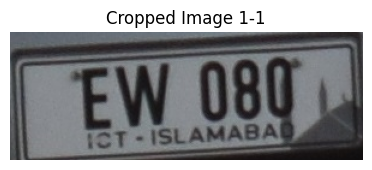

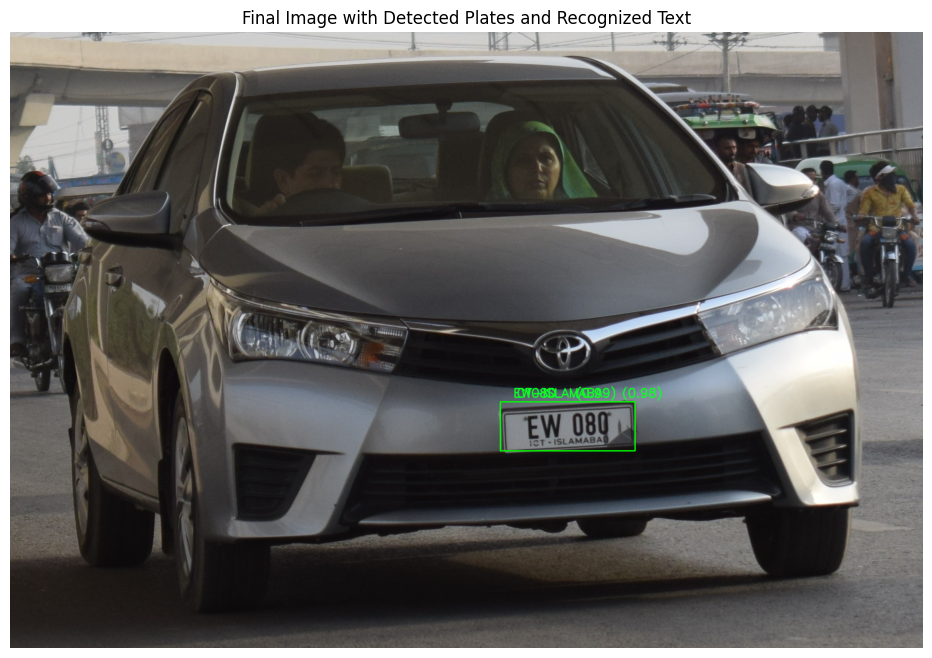


image 1/1 /kaggle/input/cartesting/DSC_0994.JPG: 448x640 1 plat, 7.6ms
Speed: 2.5ms preprocess, 7.6ms inference, 1.3ms postprocess per image at shape (1, 3, 448, 640)
[2024/07/31 12:04:28] ppocr DEBUG: dt_boxes num : 2, elapsed : 0.07082772254943848
[2024/07/31 12:04:28] ppocr DEBUG: cls num  : 2, elapsed : 0.009201288223266602
[2024/07/31 12:04:28] ppocr DEBUG: rec_res num  : 2, elapsed : 0.09197020530700684
OCR result for cropped image 1-1:
Text: FSA, Confidence: 0.99
Text: 5750, Confidence: 1.00




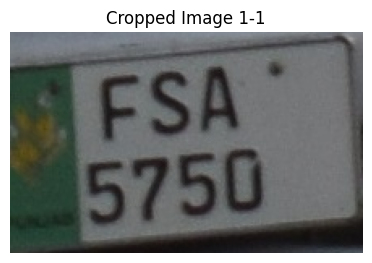

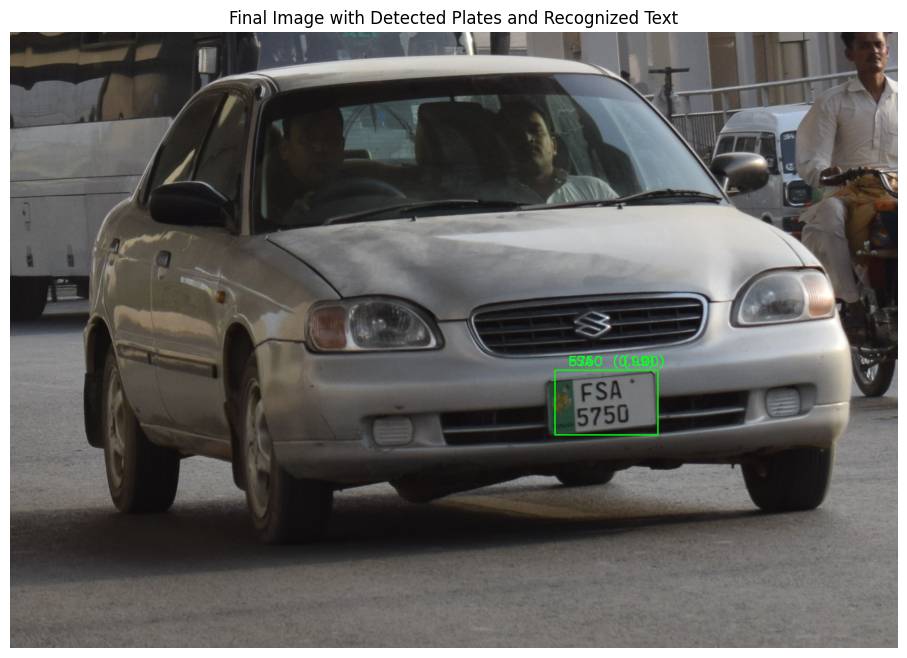


image 1/1 /kaggle/input/cartesting/DSC_0982.JPG: 448x640 2 plats, 9.2ms
Speed: 2.5ms preprocess, 9.2ms inference, 1.7ms postprocess per image at shape (1, 3, 448, 640)
[2024/07/31 12:04:29] ppocr DEBUG: dt_boxes num : 2, elapsed : 0.0555415153503418
[2024/07/31 12:04:29] ppocr DEBUG: cls num  : 2, elapsed : 0.009624242782592773
[2024/07/31 12:04:29] ppocr DEBUG: rec_res num  : 2, elapsed : 0.1078026294708252
OCR result for cropped image 1-1:
Text: LEB18, Confidence: 0.99
Text: 1194, Confidence: 1.00


[2024/07/31 12:04:29] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.12592339515686035
[2024/07/31 12:04:29] ppocr DEBUG: cls num  : 1, elapsed : 0.03315019607543945
[2024/07/31 12:04:30] ppocr DEBUG: rec_res num  : 1, elapsed : 0.09769964218139648
OCR result for cropped image 1-2:
No text detected




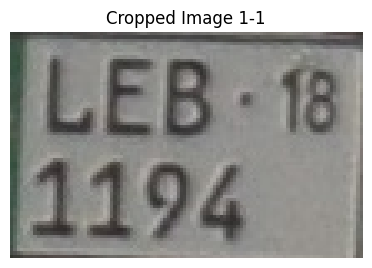

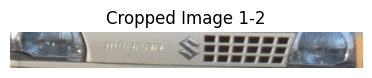

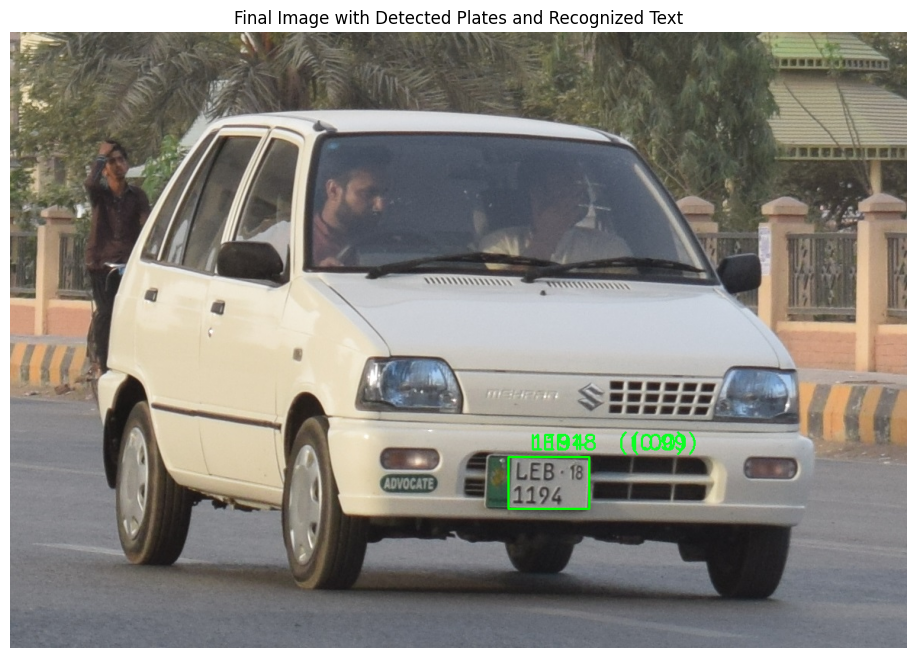


image 1/1 /kaggle/input/cartesting/DSC_0971x.jpg: 608x640 1 plat, 8.3ms
Speed: 2.6ms preprocess, 8.3ms inference, 1.3ms postprocess per image at shape (1, 3, 608, 640)
[2024/07/31 12:04:30] ppocr DEBUG: dt_boxes num : 2, elapsed : 0.05736207962036133
[2024/07/31 12:04:30] ppocr DEBUG: cls num  : 2, elapsed : 0.010806560516357422
[2024/07/31 12:04:30] ppocr DEBUG: rec_res num  : 2, elapsed : 0.09499907493591309
OCR result for cropped image 1-1:
Text: MNA-08, Confidence: 0.87
Text: 2206, Confidence: 1.00




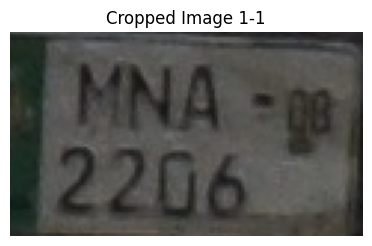

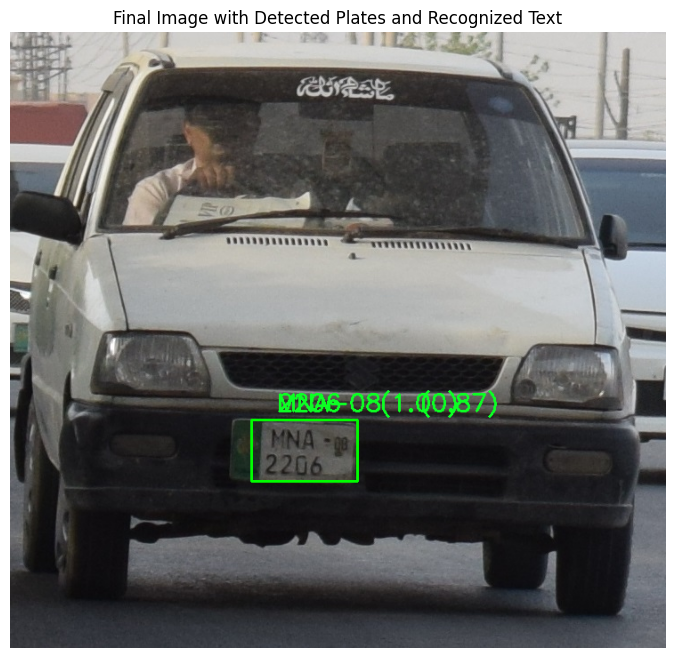


image 1/1 /kaggle/input/cartesting/DSC_0971.JPG: 608x640 1 plat, 7.5ms
Speed: 2.7ms preprocess, 7.5ms inference, 1.3ms postprocess per image at shape (1, 3, 608, 640)
[2024/07/31 12:04:31] ppocr DEBUG: dt_boxes num : 2, elapsed : 0.06125593185424805
[2024/07/31 12:04:31] ppocr DEBUG: cls num  : 2, elapsed : 0.00876474380493164
[2024/07/31 12:04:31] ppocr DEBUG: rec_res num  : 2, elapsed : 0.09561467170715332
OCR result for cropped image 1-1:
Text: PEKJIB PCUCE, Confidence: 0.63
Text: VR287, Confidence: 0.99




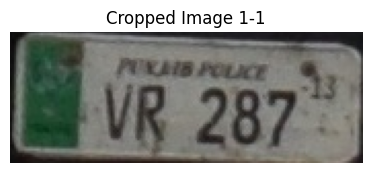

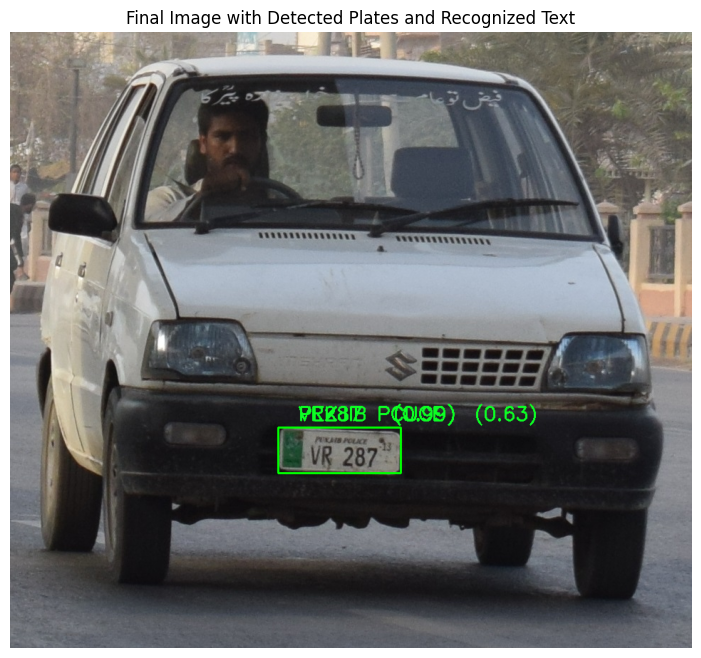


image 1/1 /kaggle/input/cartesting/DSC_0977.JPG: 544x640 1 plat, 8.2ms
Speed: 2.7ms preprocess, 8.2ms inference, 1.3ms postprocess per image at shape (1, 3, 544, 640)
[2024/07/31 12:04:32] ppocr DEBUG: dt_boxes num : 2, elapsed : 0.053963422775268555
[2024/07/31 12:04:32] ppocr DEBUG: cls num  : 2, elapsed : 0.008701562881469727
[2024/07/31 12:04:32] ppocr DEBUG: rec_res num  : 2, elapsed : 0.09192037582397461
OCR result for cropped image 1-1:
Text: LEF-16, Confidence: 0.97
Text: 2640, Confidence: 1.00




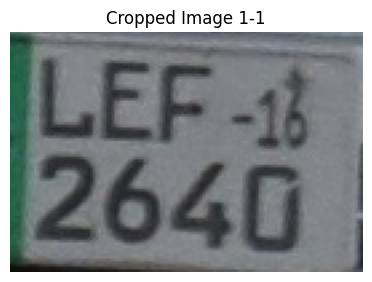

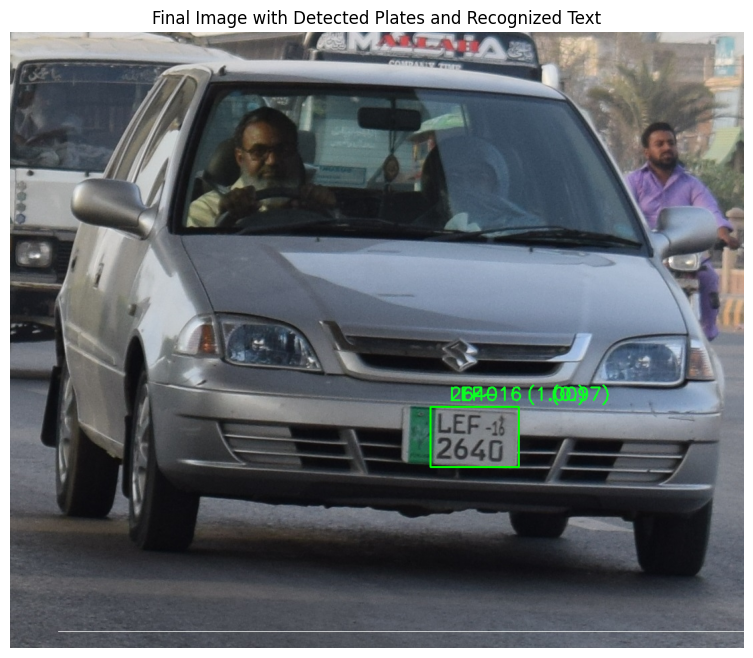


image 1/1 /kaggle/input/cartesting/DSC_0973.JPG: 576x640 1 plat, 8.4ms
Speed: 2.8ms preprocess, 8.4ms inference, 1.3ms postprocess per image at shape (1, 3, 576, 640)
[2024/07/31 12:04:33] ppocr DEBUG: dt_boxes num : 2, elapsed : 0.06529760360717773
[2024/07/31 12:04:33] ppocr DEBUG: cls num  : 2, elapsed : 0.01088404655456543
[2024/07/31 12:04:33] ppocr DEBUG: rec_res num  : 2, elapsed : 0.0977926254272461
OCR result for cropped image 1-1:
Text: MND15, Confidence: 0.97
Text: 464, Confidence: 1.00




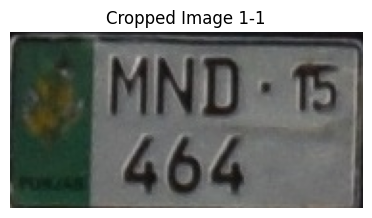

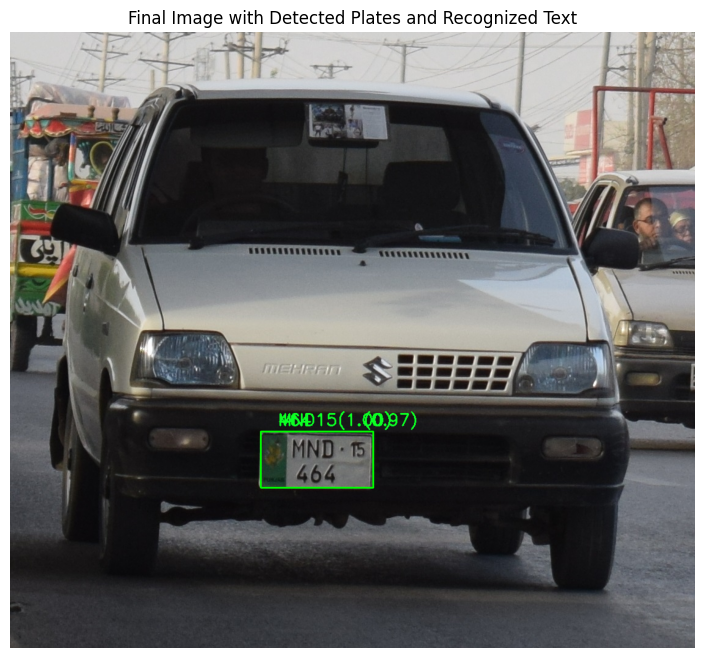


image 1/1 /kaggle/input/cartesting/DSC_0969.JPG: 544x640 1 plat, 8.4ms
Speed: 2.6ms preprocess, 8.4ms inference, 1.3ms postprocess per image at shape (1, 3, 544, 640)
[2024/07/31 12:04:34] ppocr DEBUG: dt_boxes num : 2, elapsed : 0.014975786209106445
[2024/07/31 12:04:34] ppocr DEBUG: cls num  : 2, elapsed : 0.009149789810180664
[2024/07/31 12:04:34] ppocr DEBUG: rec_res num  : 2, elapsed : 0.09225773811340332
OCR result for cropped image 1-1:
Text: MNA-08, Confidence: 0.93
Text: 3685, Confidence: 1.00




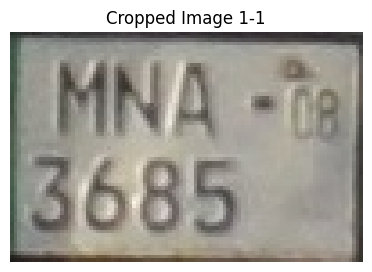

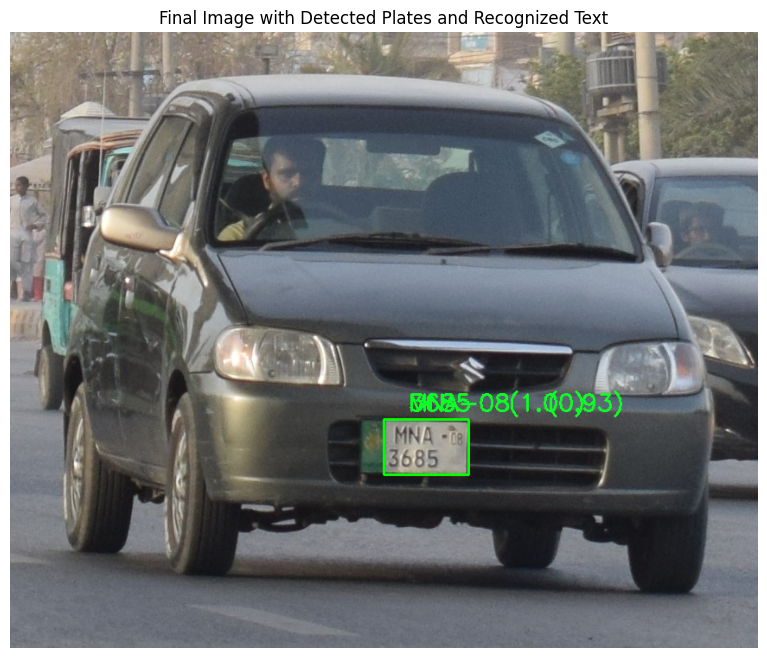


image 1/1 /kaggle/input/cartesting/DSC_0989.JPG: 416x640 1 plat, 10.0ms
Speed: 2.8ms preprocess, 10.0ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)
[2024/07/31 12:04:35] ppocr DEBUG: dt_boxes num : 2, elapsed : 0.09756326675415039
[2024/07/31 12:04:35] ppocr DEBUG: cls num  : 2, elapsed : 0.010164022445678711
[2024/07/31 12:04:35] ppocr DEBUG: rec_res num  : 2, elapsed : 0.09866499900817871
OCR result for cropped image 1-1:
Text: LE-i1, Confidence: 0.77
Text: 9088, Confidence: 1.00




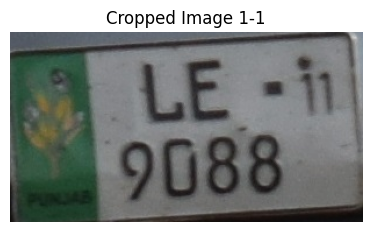

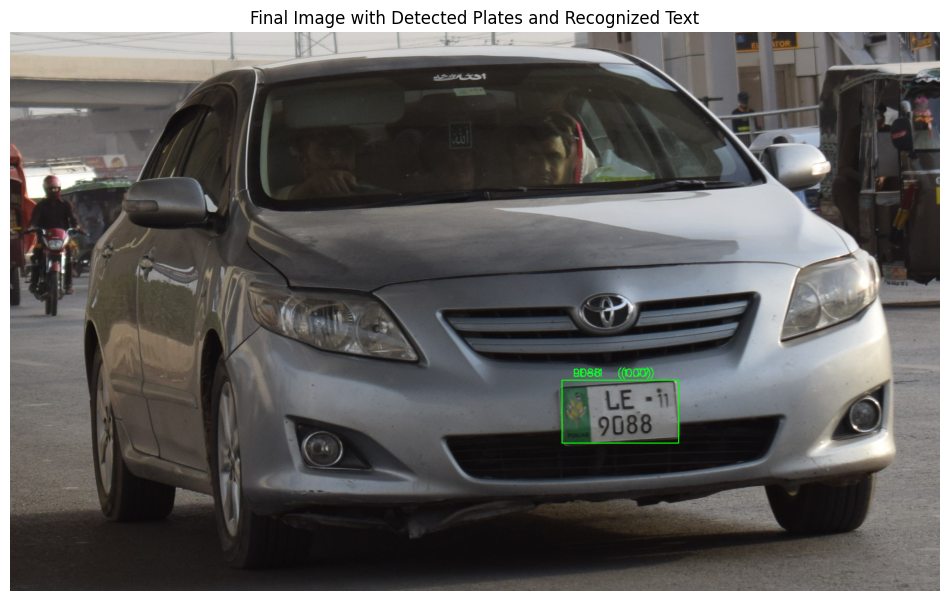


image 1/1 /kaggle/input/cartesting/DSC_0996.JPG: 544x640 1 plat, 8.2ms
Speed: 2.8ms preprocess, 8.2ms inference, 1.2ms postprocess per image at shape (1, 3, 544, 640)
[2024/07/31 12:04:36] ppocr DEBUG: dt_boxes num : 2, elapsed : 0.02134227752685547
[2024/07/31 12:04:36] ppocr DEBUG: cls num  : 2, elapsed : 0.008590221405029297
[2024/07/31 12:04:36] ppocr DEBUG: rec_res num  : 2, elapsed : 0.09138202667236328
OCR result for cropped image 1-1:
Text: BRS-12, Confidence: 0.95
Text: 1500, Confidence: 1.00




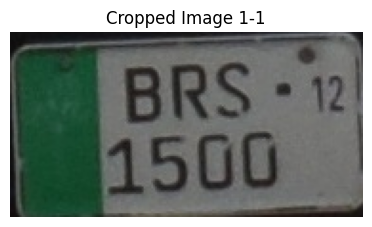

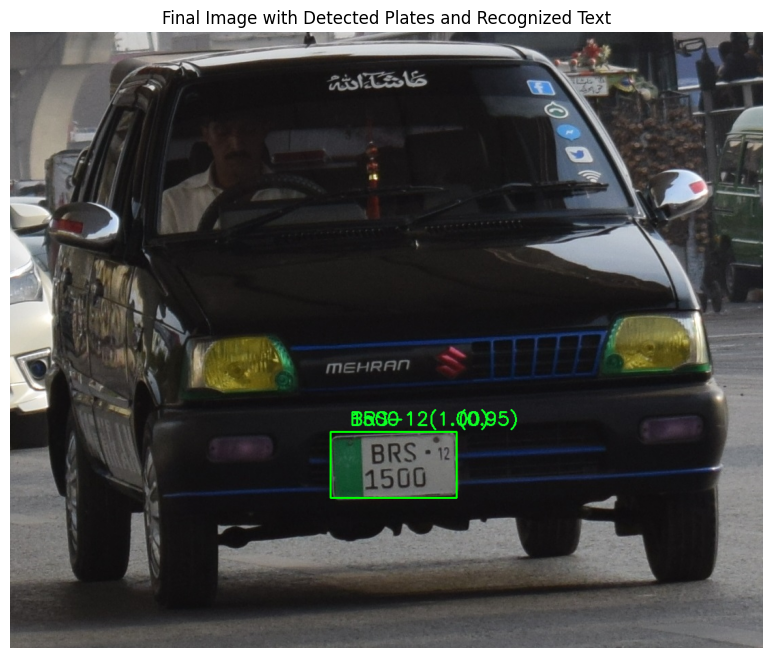


image 1/1 /kaggle/input/cartesting/DSC_0997.JPG: 416x640 1 plat, 8.3ms
Speed: 2.7ms preprocess, 8.3ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
[2024/07/31 12:04:37] ppocr DEBUG: dt_boxes num : 2, elapsed : 0.06179666519165039
[2024/07/31 12:04:37] ppocr DEBUG: cls num  : 2, elapsed : 0.008990764617919922
[2024/07/31 12:04:37] ppocr DEBUG: rec_res num  : 2, elapsed : 0.09361529350280762
OCR result for cropped image 1-1:
Text: MNA17, Confidence: 0.90
Text: 486, Confidence: 1.00




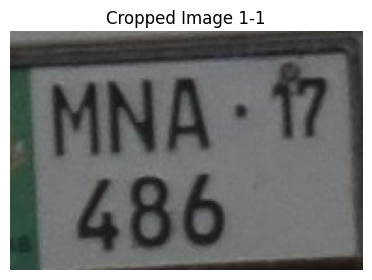

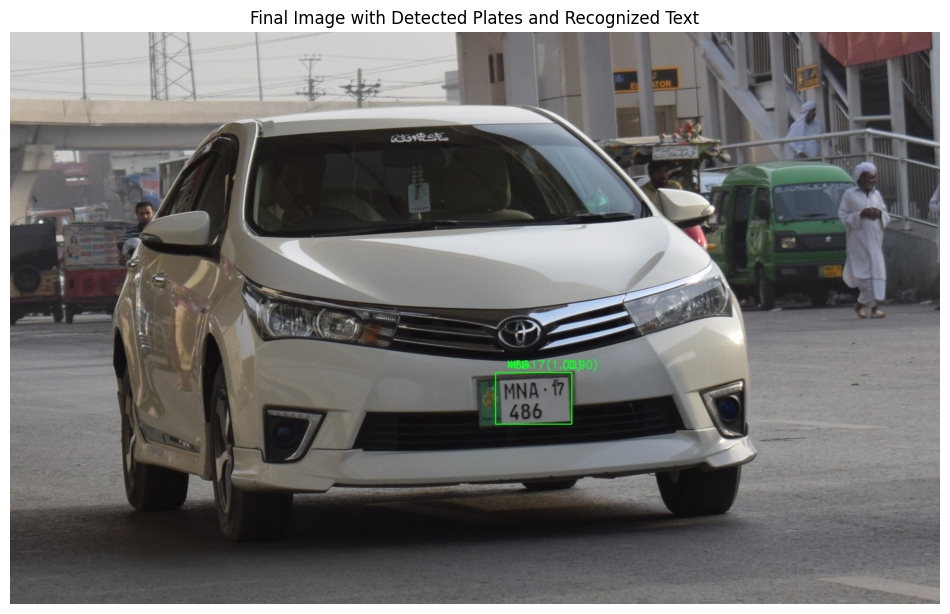


image 1/1 /kaggle/input/cartesting/DSC_0979.JPG: 448x640 1 plat, 8.3ms
Speed: 2.4ms preprocess, 8.3ms inference, 1.3ms postprocess per image at shape (1, 3, 448, 640)
[2024/07/31 12:04:38] ppocr DEBUG: dt_boxes num : 2, elapsed : 0.01992511749267578
[2024/07/31 12:04:38] ppocr DEBUG: cls num  : 2, elapsed : 0.009084701538085938
[2024/07/31 12:04:38] ppocr DEBUG: rec_res num  : 2, elapsed : 0.09425735473632812
OCR result for cropped image 1-1:
Text: BRA-09, Confidence: 0.95
Text: 1408, Confidence: 1.00




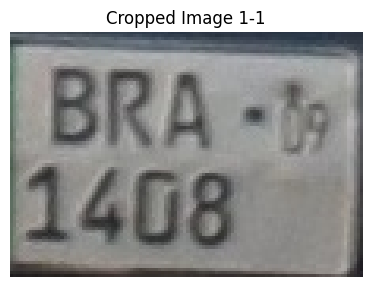

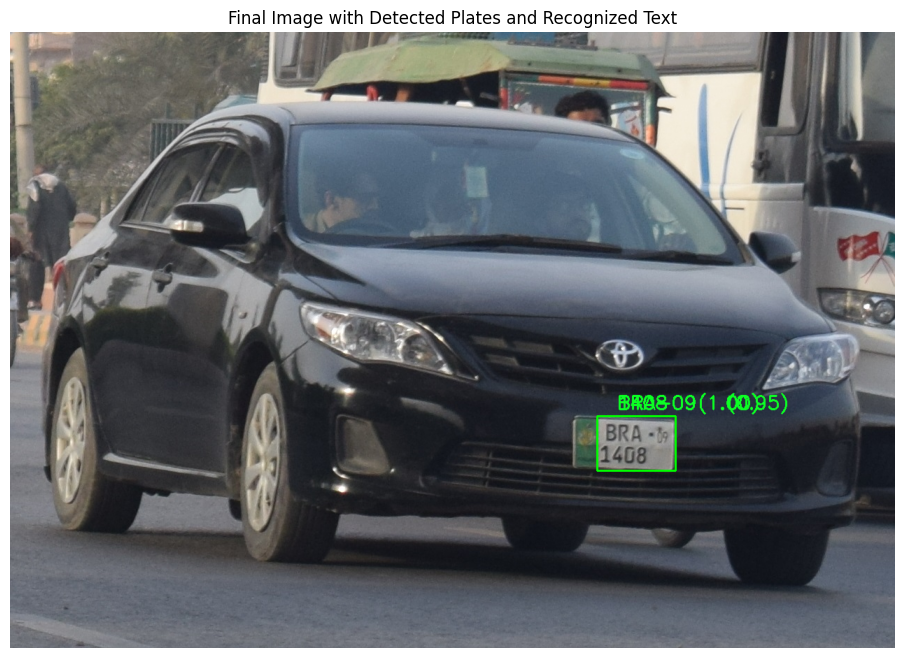


image 1/1 /kaggle/input/cartesting/DSC_0984.JPG: 416x640 1 plat, 8.0ms
Speed: 2.4ms preprocess, 8.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)
[2024/07/31 12:04:39] ppocr DEBUG: dt_boxes num : 2, elapsed : 0.0790095329284668
[2024/07/31 12:04:39] ppocr DEBUG: cls num  : 2, elapsed : 0.00879216194152832
[2024/07/31 12:04:39] ppocr DEBUG: rec_res num  : 2, elapsed : 0.0919492244720459
OCR result for cropped image 1-1:
Text: LEC-, Confidence: 0.92
Text: 1487, Confidence: 1.00




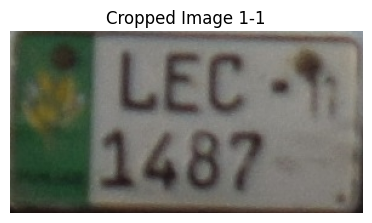

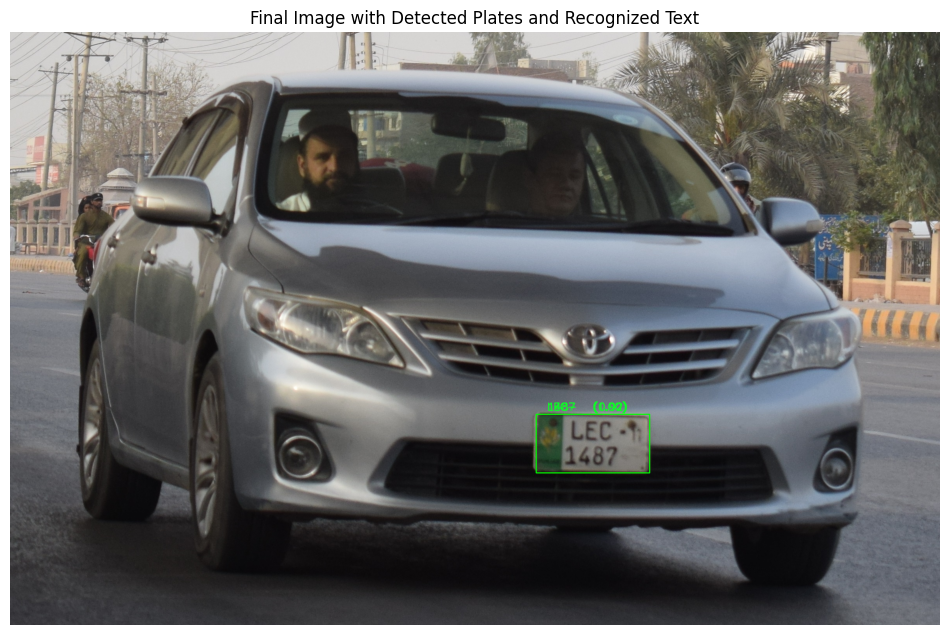


image 1/1 /kaggle/input/cartesting/DSC_0992.JPG: 544x640 1 plat, 8.2ms
Speed: 3.1ms preprocess, 8.2ms inference, 1.3ms postprocess per image at shape (1, 3, 544, 640)
[2024/07/31 12:04:40] ppocr DEBUG: dt_boxes num : 2, elapsed : 0.027252197265625
[2024/07/31 12:04:40] ppocr DEBUG: cls num  : 2, elapsed : 0.009157419204711914
[2024/07/31 12:04:40] ppocr DEBUG: rec_res num  : 2, elapsed : 0.09311509132385254
OCR result for cropped image 1-1:
Text: LEA17, Confidence: 0.99
Text: 8999, Confidence: 1.00




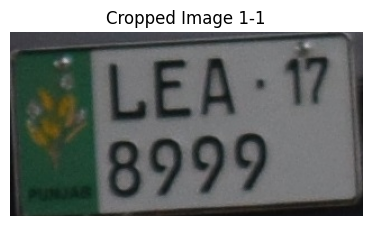

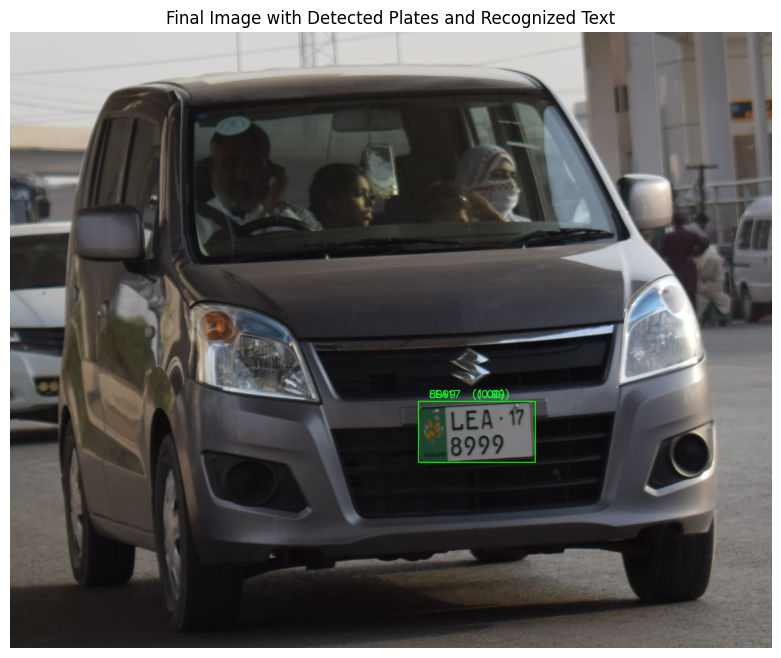


image 1/1 /kaggle/input/cartesting/DSC_0970.JPG: 576x640 1 plat, 8.4ms
Speed: 4.3ms preprocess, 8.4ms inference, 1.3ms postprocess per image at shape (1, 3, 576, 640)
[2024/07/31 12:04:41] ppocr DEBUG: dt_boxes num : 2, elapsed : 0.015039205551147461
[2024/07/31 12:04:41] ppocr DEBUG: cls num  : 2, elapsed : 0.00946044921875
[2024/07/31 12:04:41] ppocr DEBUG: rec_res num  : 2, elapsed : 0.09303808212280273
OCR result for cropped image 1-1:
Text: LWK, Confidence: 1.00
Text: 5850, Confidence: 0.99




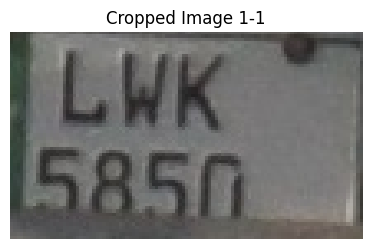

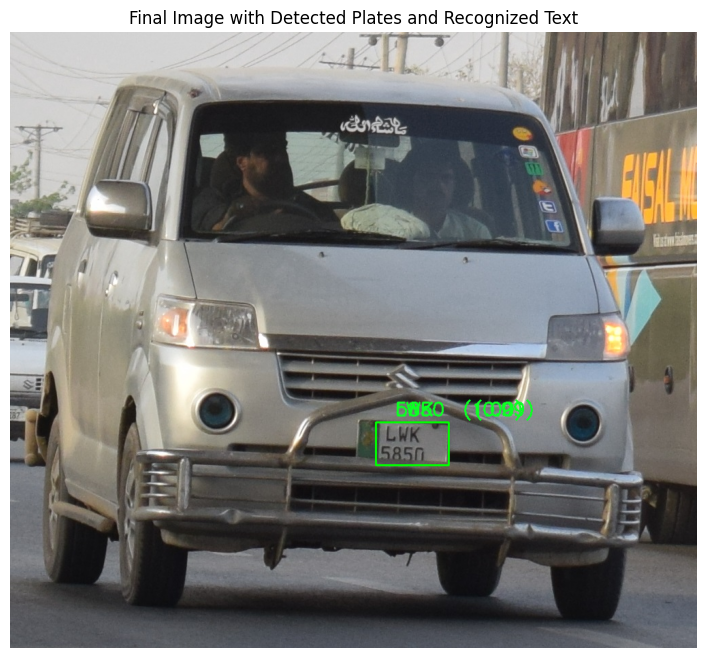


image 1/1 /kaggle/input/cartesting/DSC_0990.JPG: 608x640 1 plat, 8.5ms
Speed: 3.3ms preprocess, 8.5ms inference, 1.3ms postprocess per image at shape (1, 3, 608, 640)
[2024/07/31 12:04:42] ppocr DEBUG: dt_boxes num : 2, elapsed : 0.014748811721801758
[2024/07/31 12:04:42] ppocr DEBUG: cls num  : 2, elapsed : 0.009279012680053711
[2024/07/31 12:04:42] ppocr DEBUG: rec_res num  : 2, elapsed : 0.09035277366638184
OCR result for cropped image 1-1:
Text: MNA-08, Confidence: 0.98
Text: 5007, Confidence: 1.00




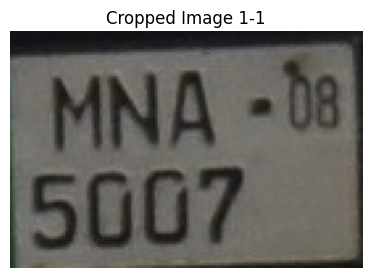

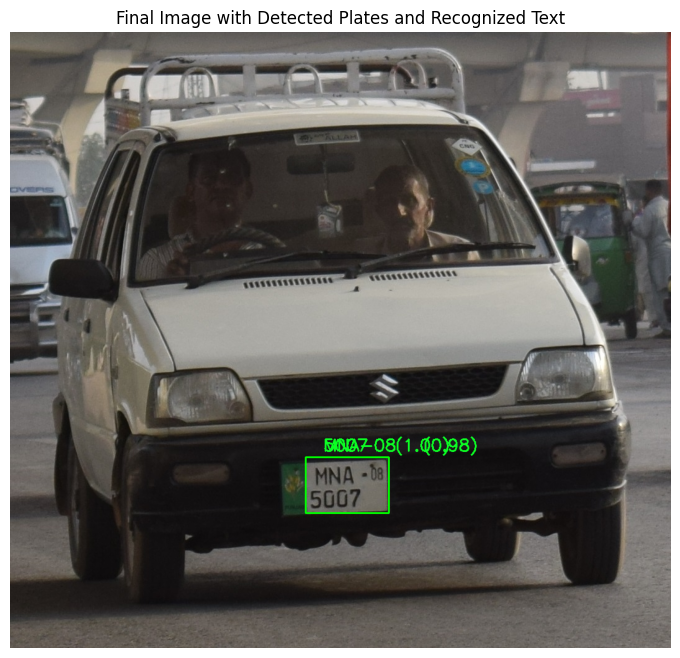


image 1/1 /kaggle/input/cartesting/DSC_0973x.jpg: 512x640 1 plat, 7.9ms
Speed: 2.6ms preprocess, 7.9ms inference, 1.2ms postprocess per image at shape (1, 3, 512, 640)
[2024/07/31 12:04:43] ppocr DEBUG: dt_boxes num : 2, elapsed : 0.06383585929870605
[2024/07/31 12:04:43] ppocr DEBUG: cls num  : 2, elapsed : 0.008807659149169922
[2024/07/31 12:04:43] ppocr DEBUG: rec_res num  : 2, elapsed : 0.09177255630493164
OCR result for cropped image 1-1:
Text: BFM-731, Confidence: 0.98
Text: SENOH, Confidence: 0.80




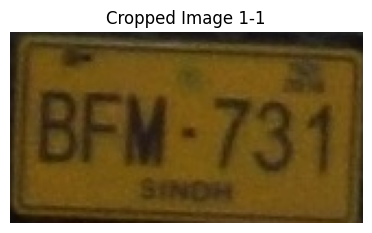

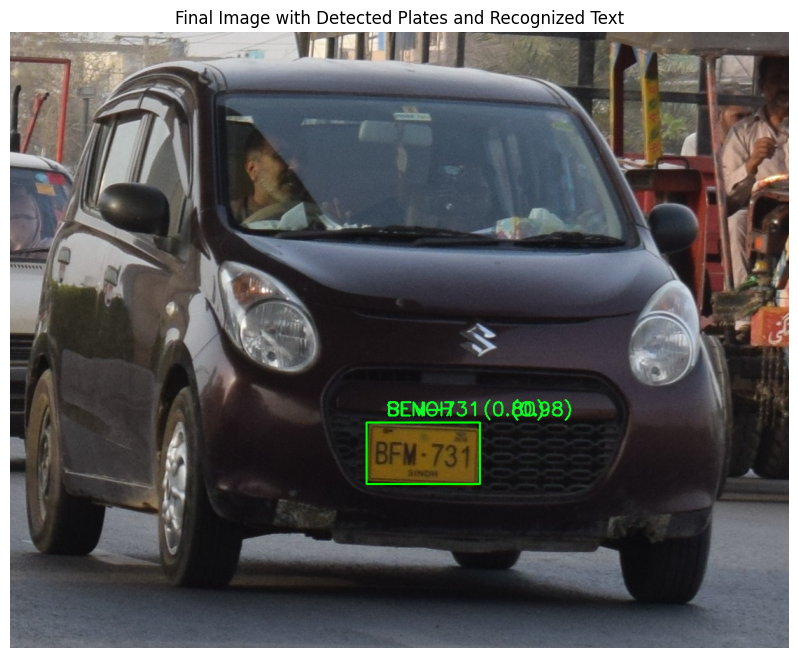


image 1/1 /kaggle/input/cartesting/DSC_0983.JPG: 480x640 1 plat, 8.2ms
Speed: 2.6ms preprocess, 8.2ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)
[2024/07/31 12:04:44] ppocr DEBUG: dt_boxes num : 2, elapsed : 0.013398408889770508
[2024/07/31 12:04:44] ppocr DEBUG: cls num  : 2, elapsed : 0.008558511734008789
[2024/07/31 12:04:44] ppocr DEBUG: rec_res num  : 2, elapsed : 0.09144115447998047
OCR result for cropped image 1-1:
Text: MNE-17, Confidence: 0.89
Text: 103, Confidence: 1.00




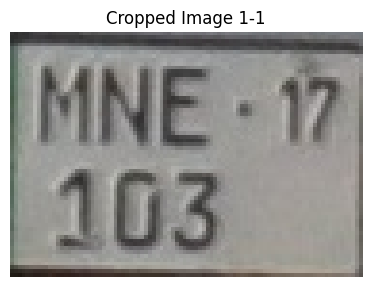

In [ ]:
for i in images:
    output_image = detect_and_recognize_text(i, yolo_model, ocr)
    # Display the final image with all detected plates and recognized text
    plt.figure(figsize=(12, 8))
    plt.imshow(cv2.cvtColor(output_image, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.title("Final Image with Detected Plates and Recognized Text")
    plt.show()

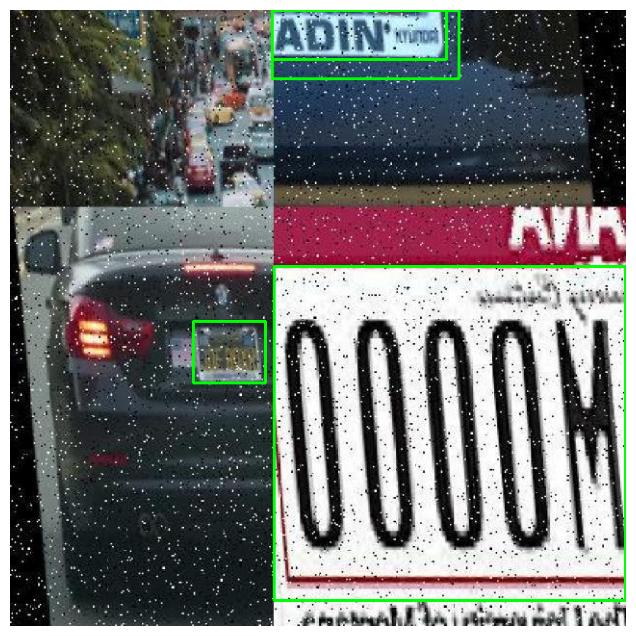

In [40]:
# Plot the image with detected license plates and recognized text
plt.figure(figsize=(12, 8))
plt.imshow(output_image_rgb)
plt.axis('off')
plt.show()

In [5]:
# Define the classes (shirt colors)
# model_path = '/kaggle/working/yolov8_Car_Plate.pt'
# classes = ['plat']

In [38]:
# # Function to detect shirt color in a static image
# def detect_shirt_color(image_path, model_path):
#     model = YOLO(model_path)
#     img = cv2.imread(image_path)
#     results = model(img)
    
#     # Assuming the results object contains a list of detections
#     if results and results[0].boxes:  # Check if there are any detections
#         for box in results[0].boxes:
#             x1, y1, x2, y2 = box.xyxy[0]  # Coordinates
#             conf = box.conf[0]  # Confidence
#             cls = int(box.cls[0])  # Class index
#             color = classes[cls]  # Class name
#             cv2.rectangle(img, (int(x1), int(y1)), (int(x2), int(y2)), (0, 255, 0), 2)
#             cv2.putText(img, f'{color} ({conf:.2f})', (int(x1), int(y1) - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (36, 255, 12), 2)
    
# #     img_resized = cv2.resize(img, (900, 800))  # Adjust the size as needed
#     plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
#     plt.axis()  # Hide axes
#     plt.show()


0: 640x640 4 plats, 9.5ms
Speed: 2.6ms preprocess, 9.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


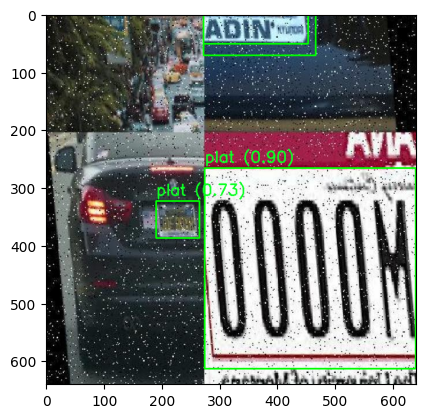

In [39]:
# test_image_path = '/kaggle/input/car-plate-dataset/Car-Plate-Detection-6/test/images/00_jpg.rf.f769d06fd942b40c0f4a1fb4bf28ef7b.jpg'  # Path to a test image
# detect_shirt_color(test_image_path, model_path)